In [3]:
import os
import numpy as np
from tqdm import tqdm
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras import Model
from keras.callbacks import Callback
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

In [4]:
image_path = '../temp/training/Images/'
mask_path = '../temp/training/Masks/'
SIZE = 128

In [5]:
# lists of images and masks names
image_names = sorted(next(os.walk(image_path))[-1])
mask_names = sorted(next(os.walk(mask_path))[-1])

images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = np.asarray(Image.open(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
  path = mask_path + mask_names[id]
  mask = np.asarray(Image.open(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Mask: 100%|██████████| 4245/4245 [00:14<00:00, 294.64it/s] 


In [6]:
# Train test split
# images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.01)

# Train test split with no images left for testing
images_train = images
images_test = []
mask_train = masks
mask_test = []

print(f'Train images: {len(images_train)}')
print(f'Test images: {len(images_test)}')

Train images: 4245
Test images: 0


In [7]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)
    
    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    
    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    return output_layer

In [8]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer = input_layer, start_neurons = 16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

I0000 00:00:1741248139.528880   10711 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9817 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64, 64,    │          0 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ max_pooling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ dropout_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 16, 16,    │          0 │ max_pooling2d_2[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ dropout_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 8, 8, 128) │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 8, 8, 128) │          0 │ max_pooling2d_3[

 Total params: 2,158,705 (8.23 MB)

 Trainable params: 2,158,705 (8.23 MB)

 Non-trainable params: 0 (0.00 B)

In [9]:
# Post Process
def mask_threshold(image, threshold=0.25):
  return image>threshold

# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    k = np.random.randint(len(images_train))
    original_image = images_train[k][np.newaxis,...]
    predicted_mask = self.model.predict(original_image).reshape(128,128)
    proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
    proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
    proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
    proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
    mask = mask_train[k].reshape(128,128)

    plt.figure(figsize=(15,10))

    plt.subplot(1,7,1)
    plt.imshow(original_image[0]);plt.title('Orginal Image')

    plt.subplot(1,7,2)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')
    
    plt.subplot(1,7,3)
    plt.imshow(mask, cmap='gray');plt.title('Orginal Mask')

    plt.subplot(1,7,4)
    plt.imshow(proc_mask02, cmap='gray');plt.title('Processed: 0.2')

    plt.subplot(1,7,5)
    plt.imshow(proc_mask03, cmap='gray');plt.title('Processed: 0.3')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask04, cmap='gray');plt.title('Processed: 0.4')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask05, cmap='gray');plt.title('Processed: 0.5')

    plt.tight_layout()
    plt.show()

Epoch 1/100


I0000 00:00:1741248143.210204   10865 service.cc:148] XLA service 0x7ff8b0009d60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1741248143.210383   10865 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce GTX 1080 Ti, Compute Capability 6.1
2025-03-06 00:02:23.300866: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1741248143.647009   10865 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-03-06 00:02:24.361070: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[32,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_con

  2/133 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.1416 - loss: 0.7170  

2025-03-06 00:02:32.240479: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1741248152.269057   10865 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


131/133 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.6239 - loss: 0.5316

2025-03-06 00:02:39.153690: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[21,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[21,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-03-06 00:02:39.162234: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[21,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[21,16,128,128]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationFor

133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - accuracy: 0.6249 - loss: 0.5309

2025-03-06 00:02:45.842426: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads

2025-03-06 00:02:46.093817: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-03-06 00:02:46.120871: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} f

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 771ms/step


2025-03-06 00:02:46.540637: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,32,128,128]{3,2,1,0}, f32[16,32,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}


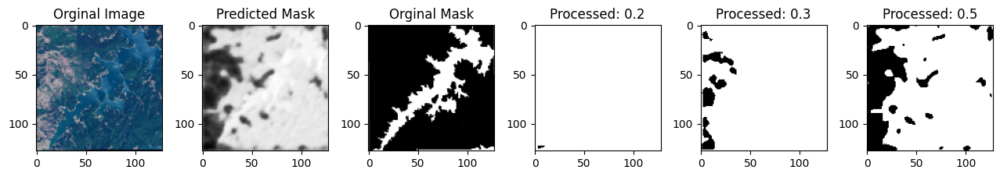

133/133 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step - accuracy: 0.6254 - loss: 0.5303
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7481 - loss: 0.34


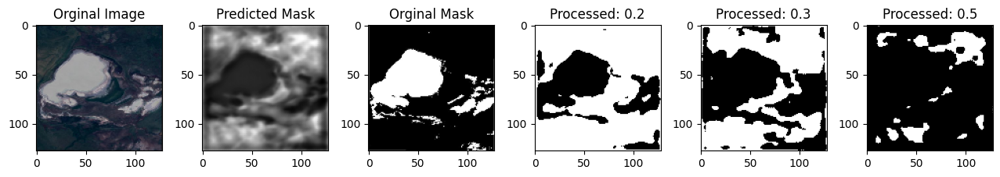

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.7482 - loss: 0.3495
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7681 - loss: 0.31


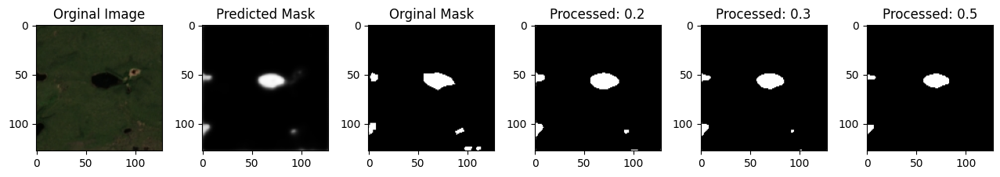

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.7681 - loss: 0.3188
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7683 - loss: 0.31


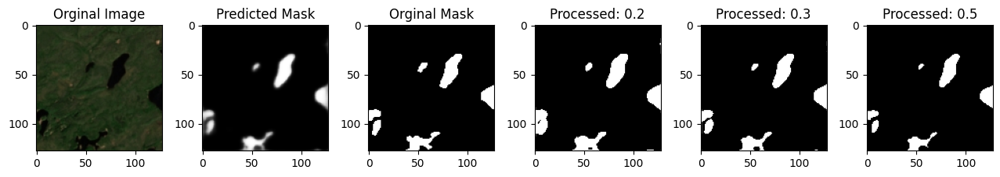

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.7684 - loss: 0.3177
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7785 - loss: 0.29


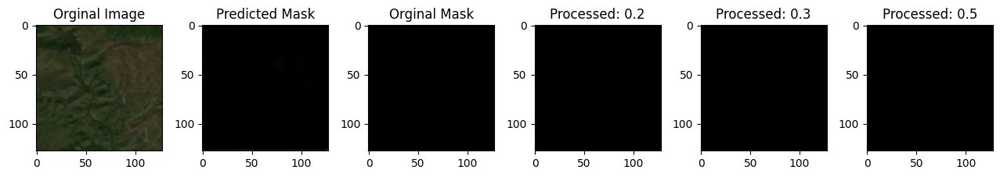

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.7785 - loss: 0.2937
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7804 - loss: 0.280


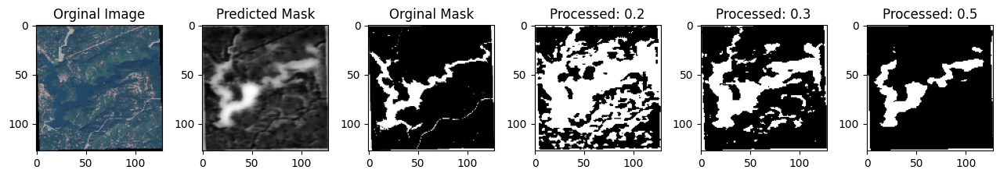

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.7804 - loss: 0.2808
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7925 - loss: 0.25


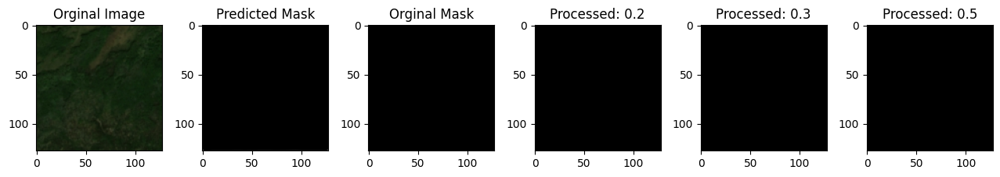

133/133 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.7924 - loss: 0.2600
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7839 - loss: 0.270


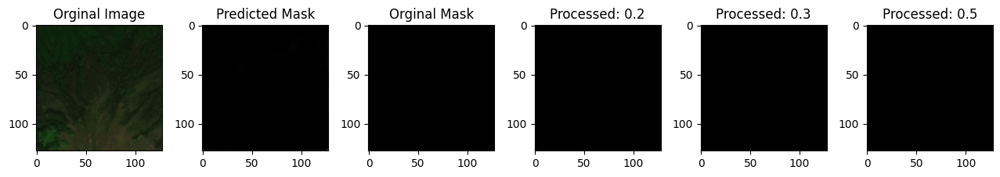

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.7840 - loss: 0.2704
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7982 - loss: 0.247


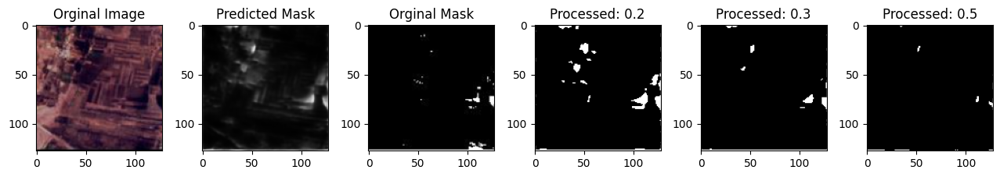

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.7981 - loss: 0.2473
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7987 - loss: 0.237


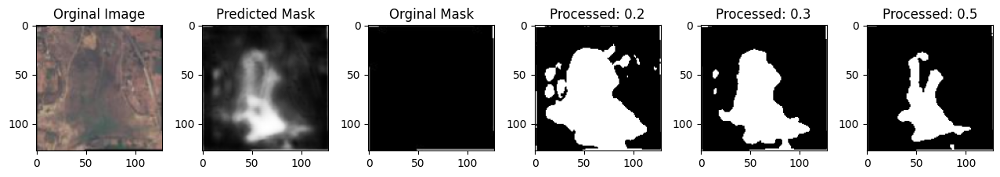

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.7987 - loss: 0.2374
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7921 - loss: 0.24


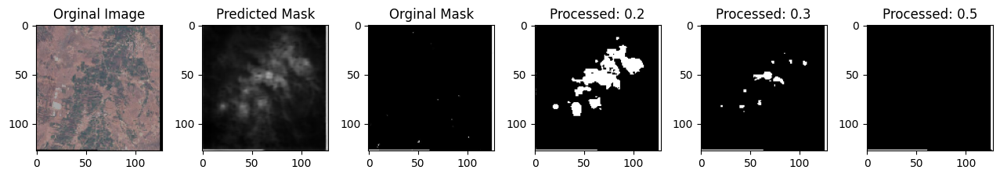

133/133 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.7921 - loss: 0.2481
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8028 - loss: 0.22


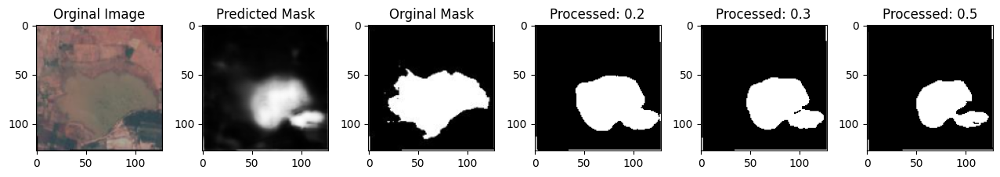

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8028 - loss: 0.2295
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8027 - loss: 0.22


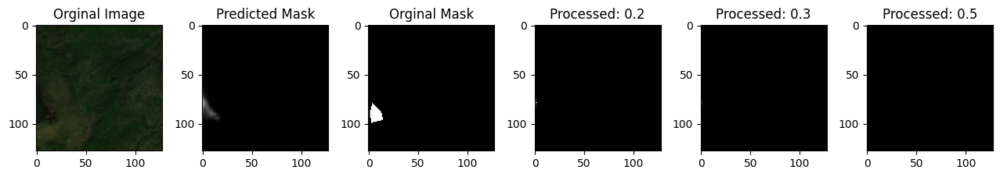

133/133 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.8027 - loss: 0.2277
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8100 - loss: 0.21


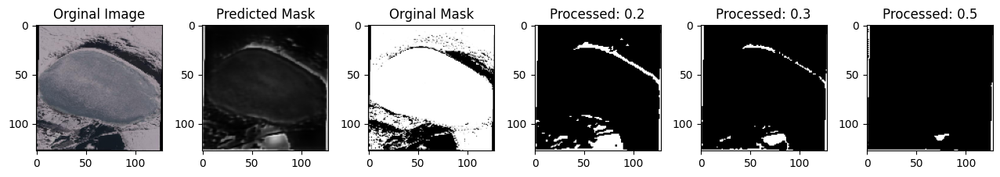

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8100 - loss: 0.2129
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8077 - loss: 0.22


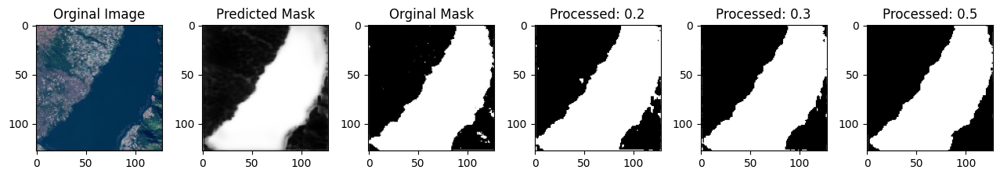

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8077 - loss: 0.2201
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8112 - loss: 0.21


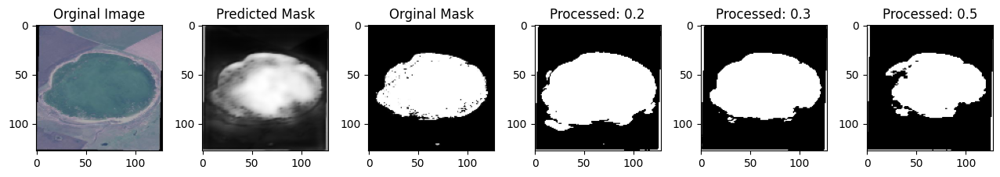

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8112 - loss: 0.2122
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8101 - loss: 0.20


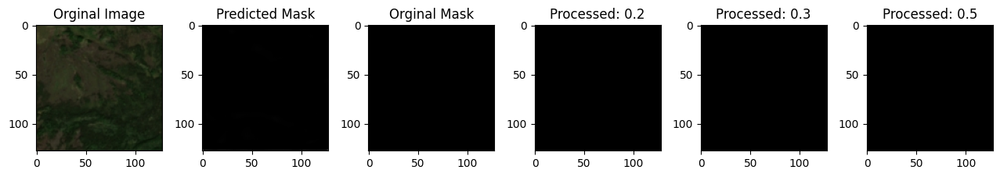

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8101 - loss: 0.2094
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8118 - loss: 0.20


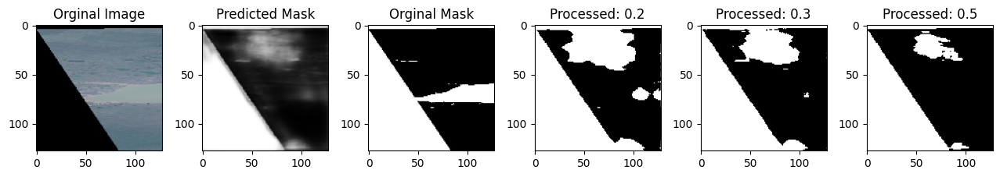

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8118 - loss: 0.2000
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8178 - loss: 0.19


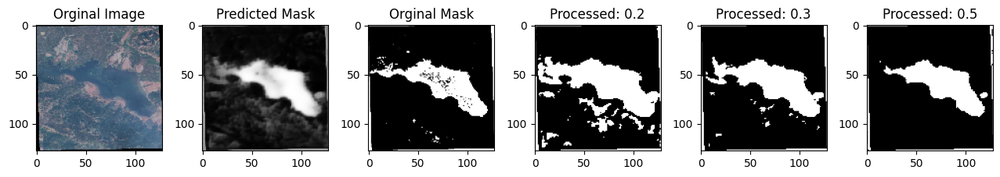

133/133 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.8178 - loss: 0.1923
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8104 - loss: 0.21


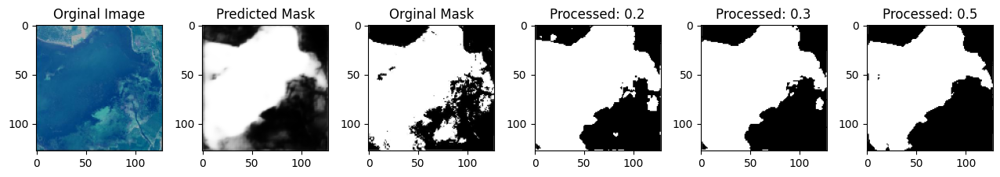

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - accuracy: 0.8104 - loss: 0.2114
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8183 - loss: 0.19


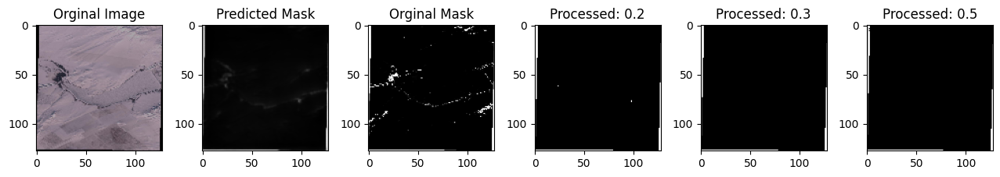

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8183 - loss: 0.1903
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8181 - loss: 0.19


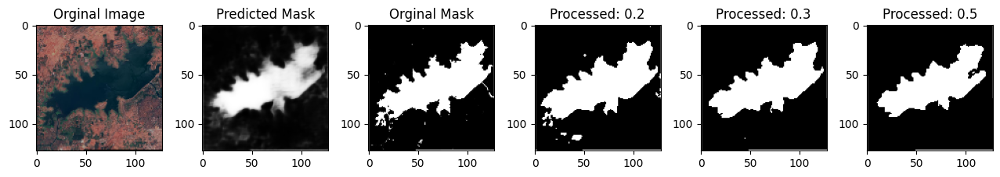

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8181 - loss: 0.1907
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8161 - loss: 0.19


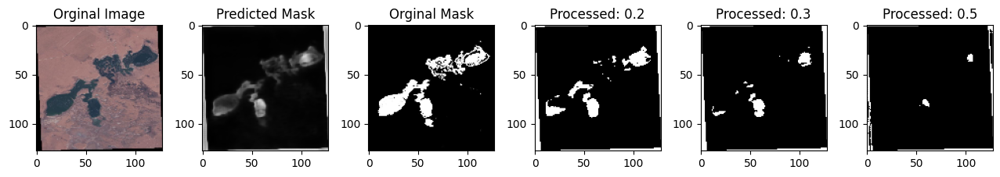

133/133 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.8161 - loss: 0.1966
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8211 - loss: 0.18


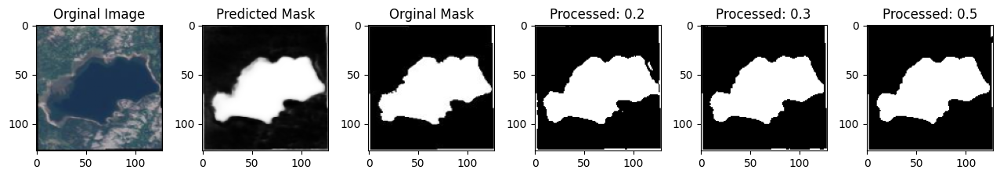

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8211 - loss: 0.1807
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8211 - loss: 0.18


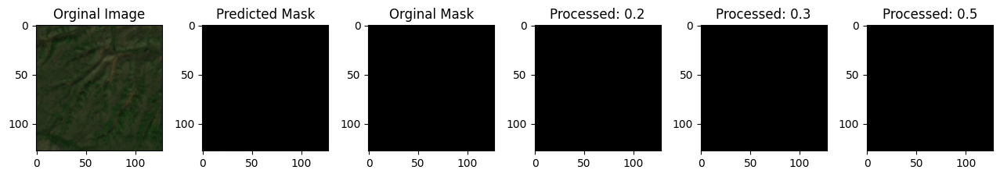

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8210 - loss: 0.1839
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8215 - loss: 0.18


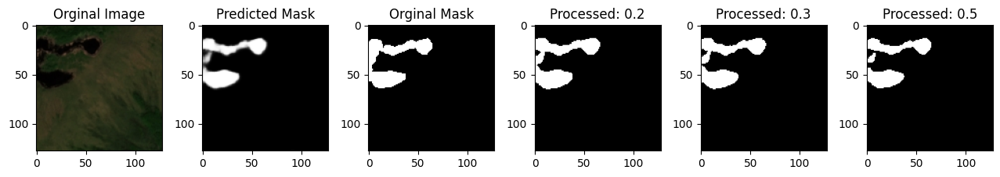

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.8215 - loss: 0.1818
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8195 - loss: 0.181


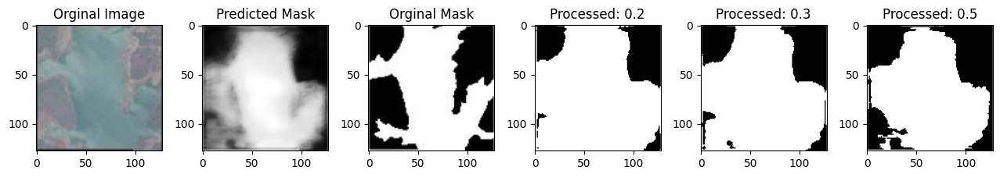

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8195 - loss: 0.1814
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8192 - loss: 0.184


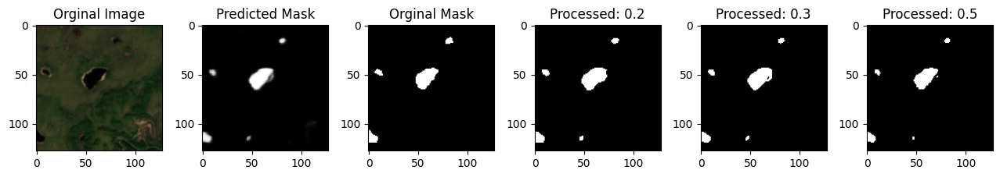

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8192 - loss: 0.1839
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8228 - loss: 0.17


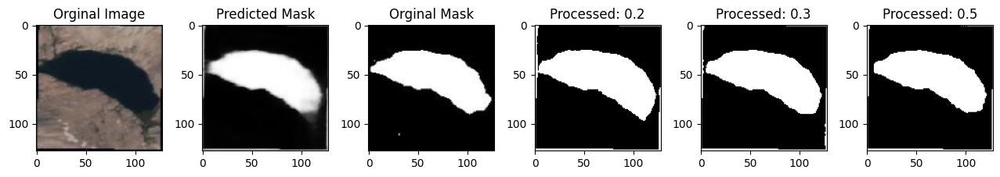

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8228 - loss: 0.1709
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8259 - loss: 0.16


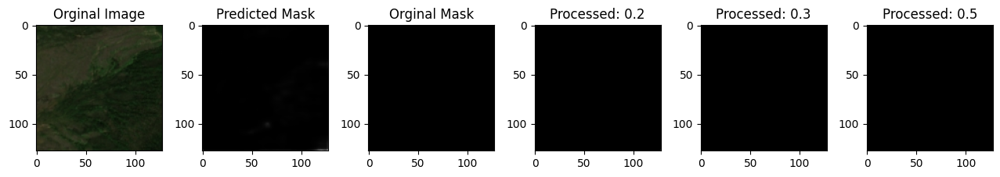

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8259 - loss: 0.1679
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8189 - loss: 0.17


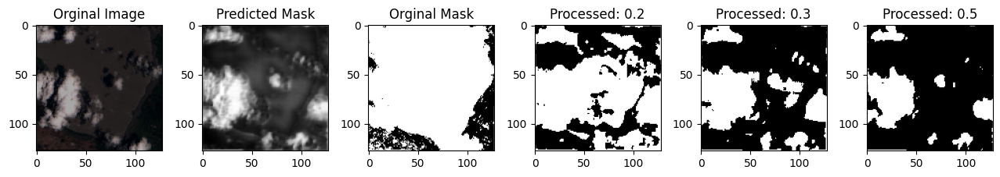

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.8189 - loss: 0.1738
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8232 - loss: 0.18


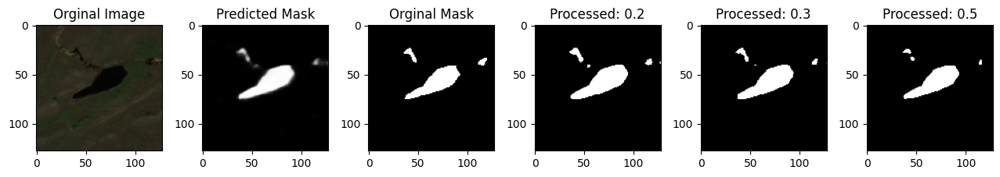

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8231 - loss: 0.1844
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8212 - loss: 0.18


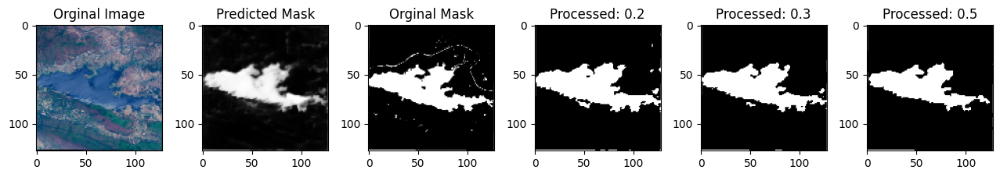

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.8212 - loss: 0.1830
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8251 - loss: 0.17


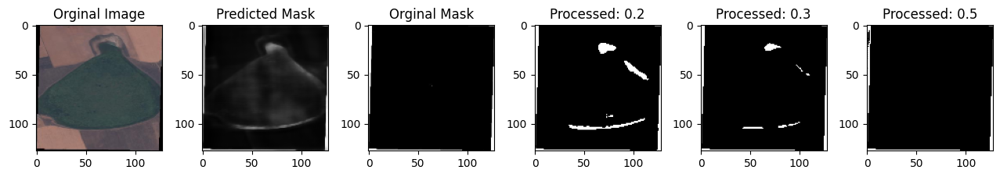

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8251 - loss: 0.1734
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8250 - loss: 0.172


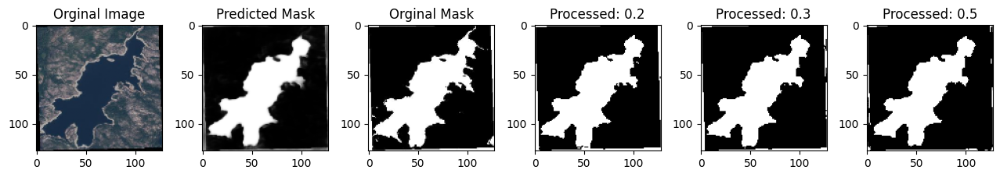

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8250 - loss: 0.1727
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/stepstep - accuracy: 0.8236 - loss: 0.168


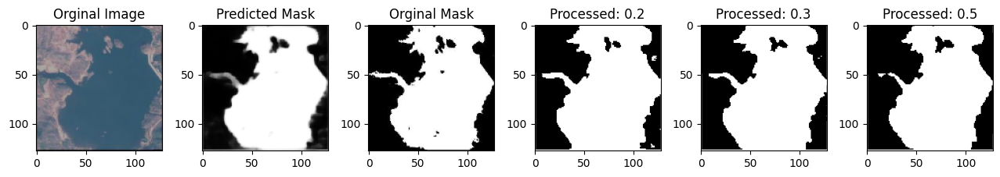

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.8236 - loss: 0.1682
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8230 - loss: 0.17


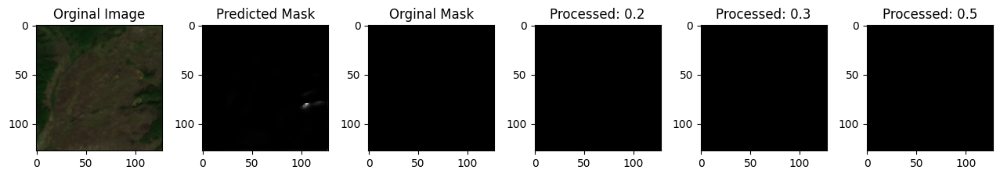

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8230 - loss: 0.1725
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8243 - loss: 0.17


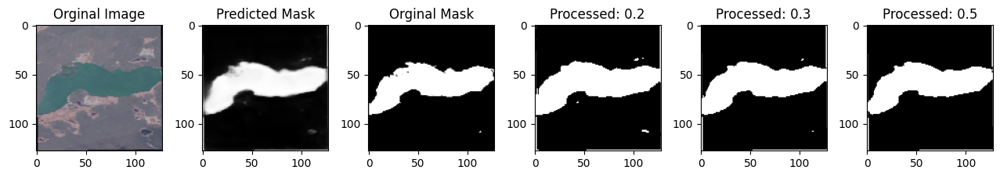

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8243 - loss: 0.1711
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8229 - loss: 0.17


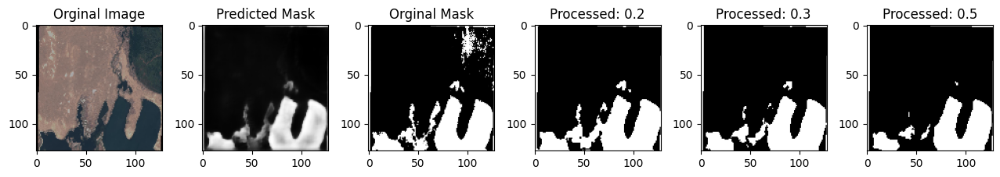

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8229 - loss: 0.1760
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8184 - loss: 0.17


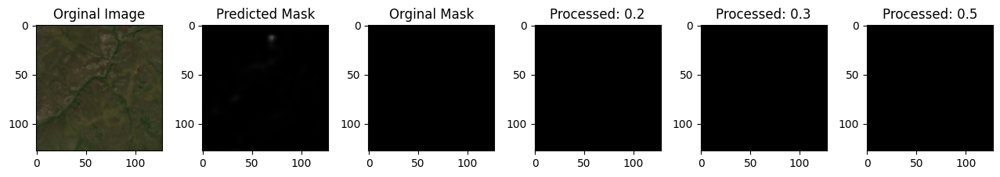

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8185 - loss: 0.1738
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8326 - loss: 0.15


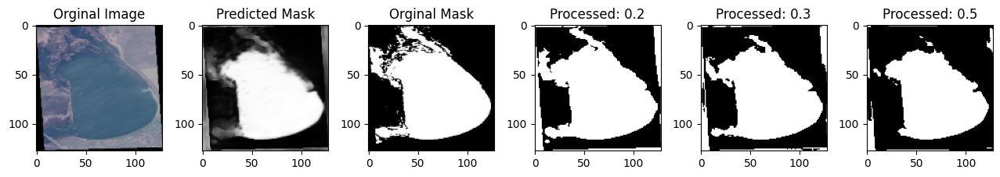

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8325 - loss: 0.1559
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8245 - loss: 0.165


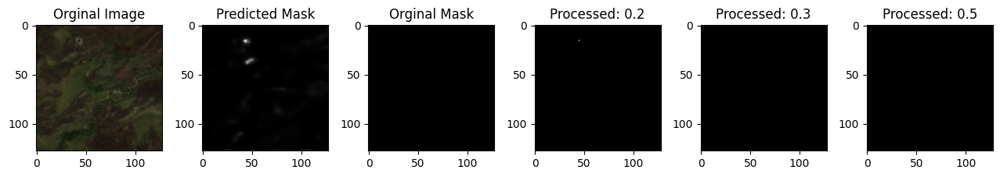

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.8245 - loss: 0.1657
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/stepstep - accuracy: 0.8227 - loss: 0.165


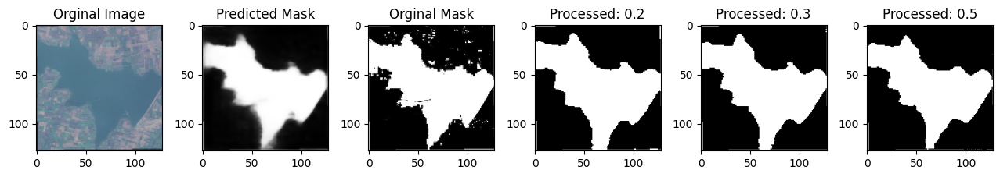

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.8227 - loss: 0.1652
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8280 - loss: 0.164


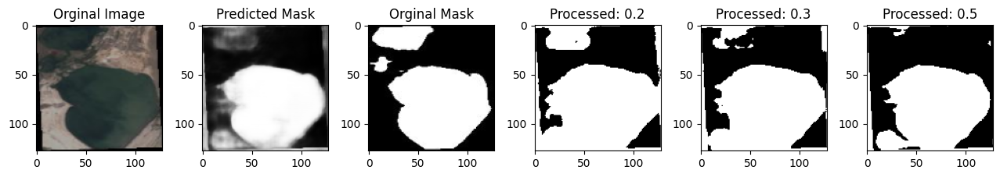

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8280 - loss: 0.1642
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8276 - loss: 0.16


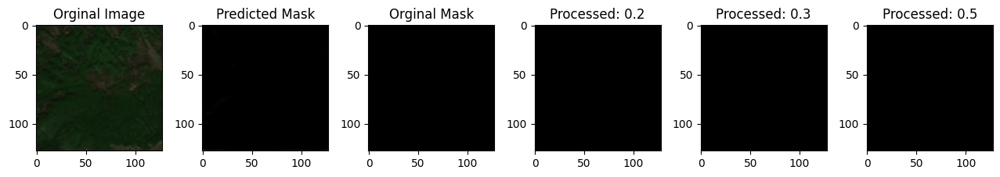

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8275 - loss: 0.1682
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8209 - loss: 0.171


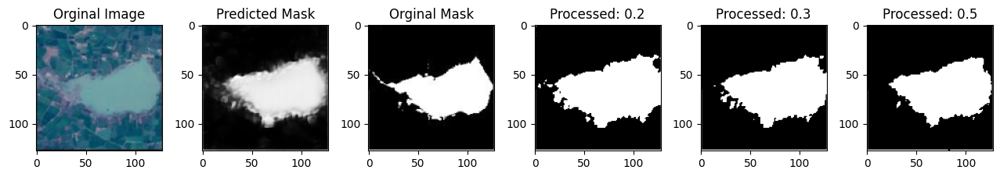

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8209 - loss: 0.1719
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8181 - loss: 0.18


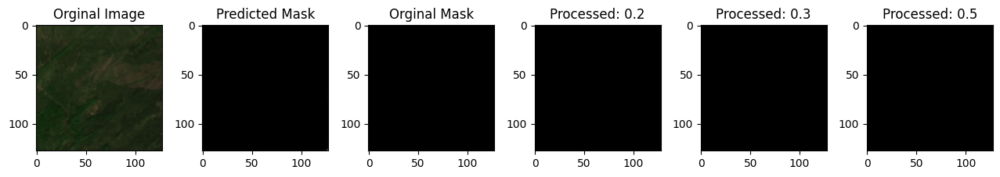

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.8181 - loss: 0.1886
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8257 - loss: 0.165


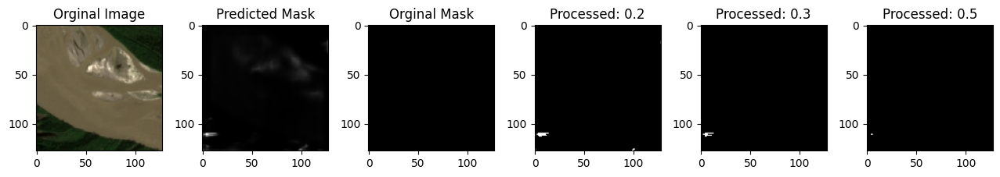

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8257 - loss: 0.1651
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8204 - loss: 0.170


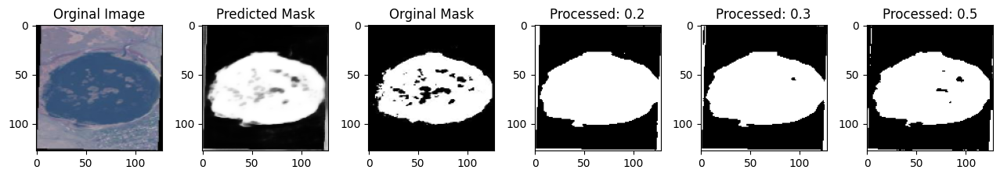

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8205 - loss: 0.1709
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8279 - loss: 0.16


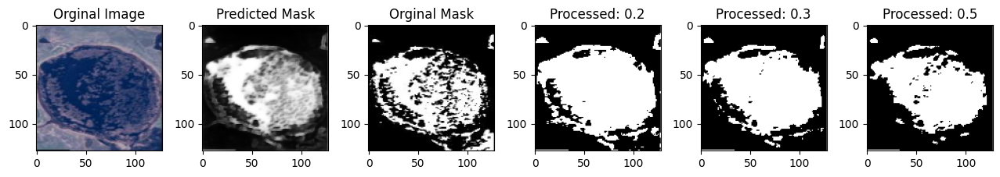

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.8279 - loss: 0.1608
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8237 - loss: 0.167


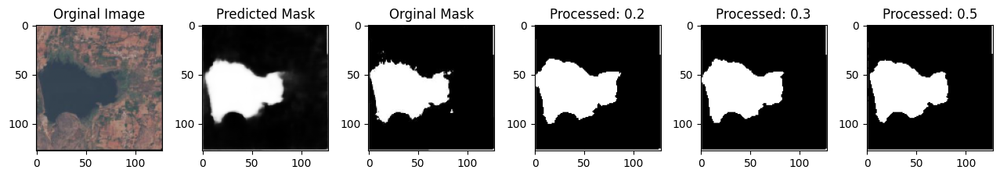

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.8237 - loss: 0.1675
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8286 - loss: 0.15


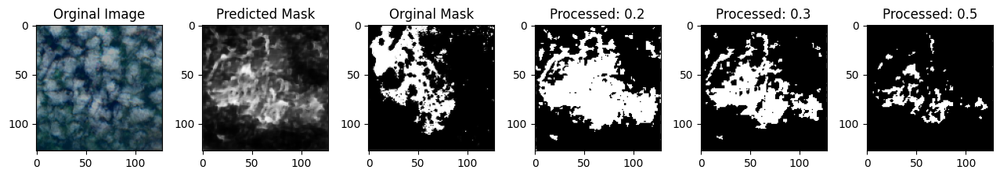

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.8286 - loss: 0.1566
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/stepstep - accuracy: 0.8293 - loss: 0.161


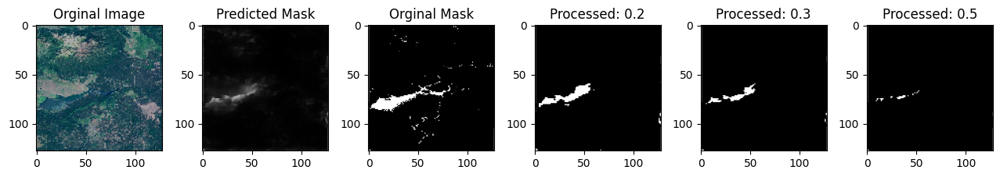

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8292 - loss: 0.1614
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8303 - loss: 0.15


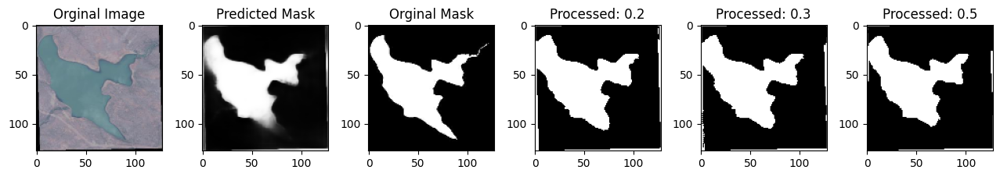

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8303 - loss: 0.1591
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8287 - loss: 0.15


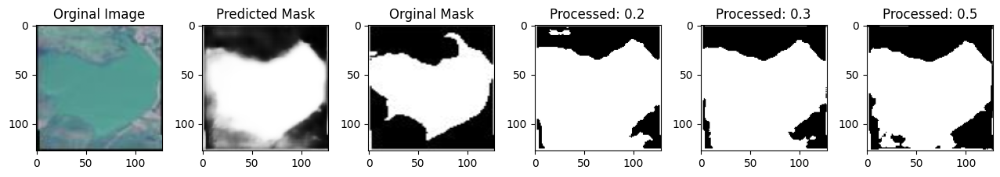

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8287 - loss: 0.1590
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8275 - loss: 0.158


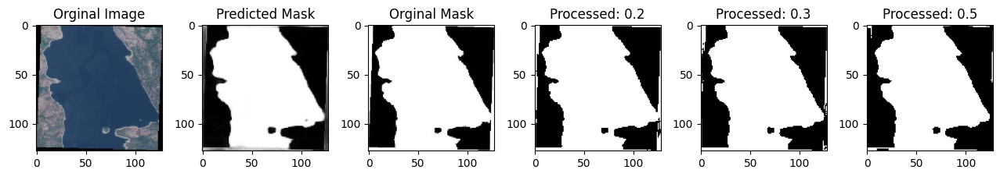

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.8275 - loss: 0.1589
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8273 - loss: 0.160


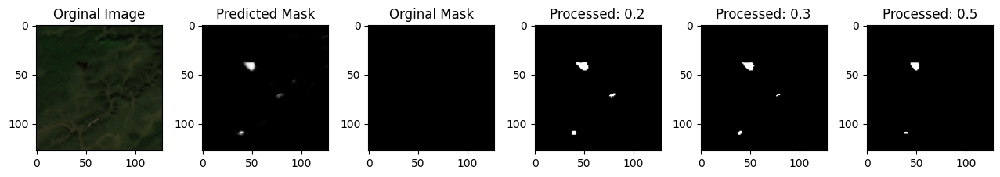

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.8273 - loss: 0.1603
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8315 - loss: 0.153


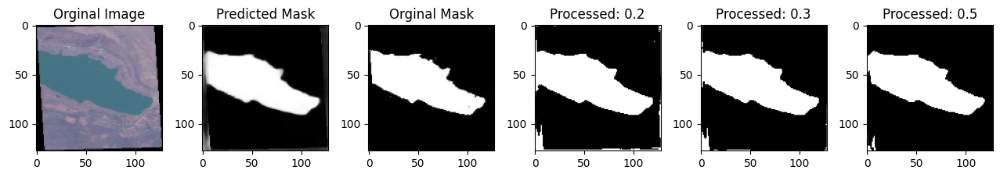

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8314 - loss: 0.1535
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8353 - loss: 0.15


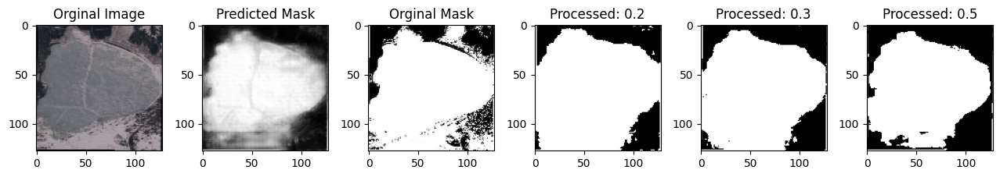

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8352 - loss: 0.1515
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8311 - loss: 0.151


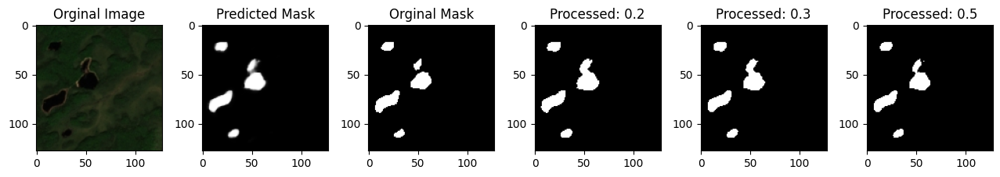

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8311 - loss: 0.1513
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8304 - loss: 0.14


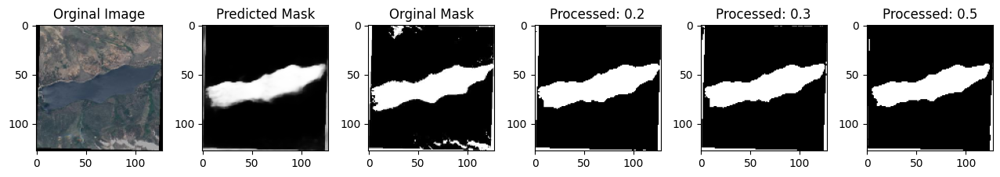

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8304 - loss: 0.1487
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8273 - loss: 0.15


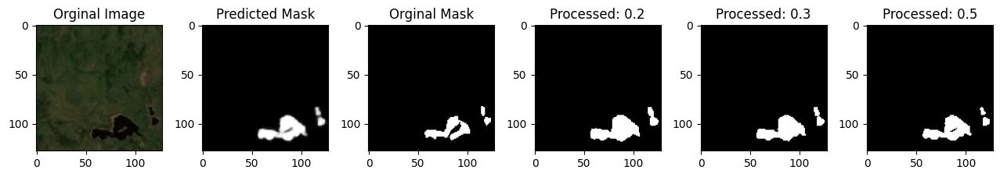

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8273 - loss: 0.1534
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8269 - loss: 0.153


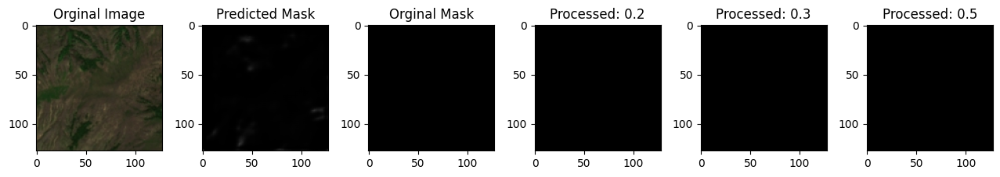

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8270 - loss: 0.1534
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8294 - loss: 0.15


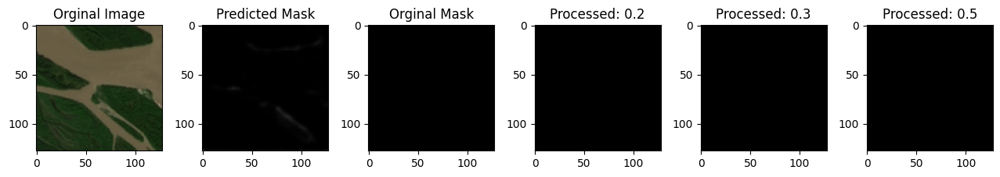

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8294 - loss: 0.1541
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8280 - loss: 0.15


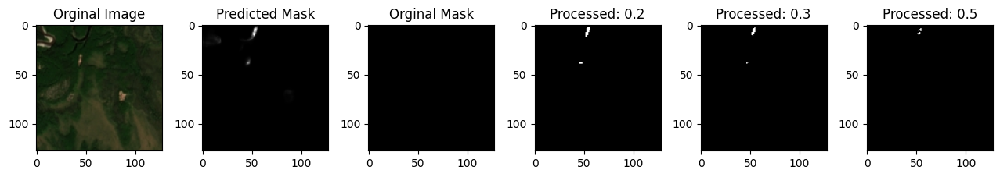

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.8280 - loss: 0.1538
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8313 - loss: 0.14


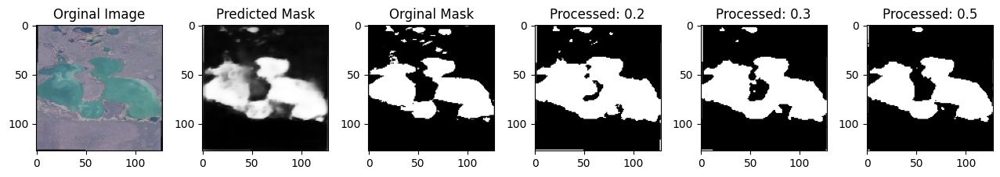

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8313 - loss: 0.1450
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8305 - loss: 0.15


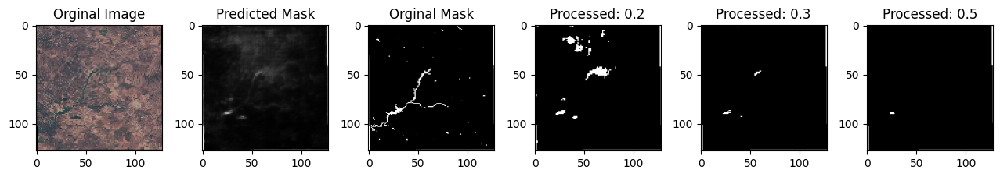

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8305 - loss: 0.1524
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8302 - loss: 0.153


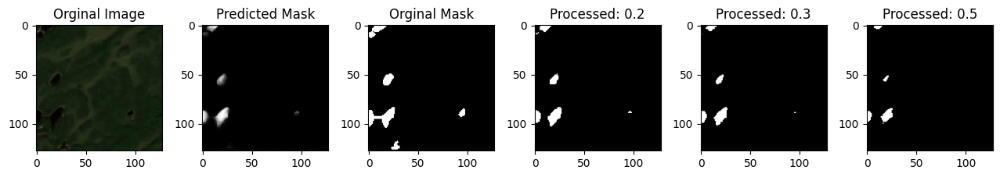

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8302 - loss: 0.1540
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8203 - loss: 0.164


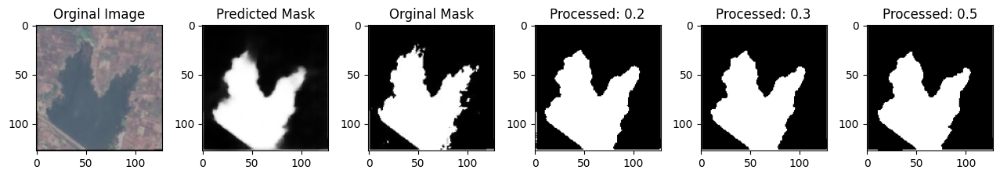

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8204 - loss: 0.1643
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8344 - loss: 0.14


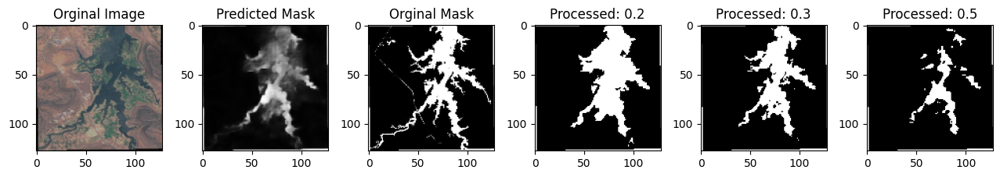

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8344 - loss: 0.1431
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8323 - loss: 0.14


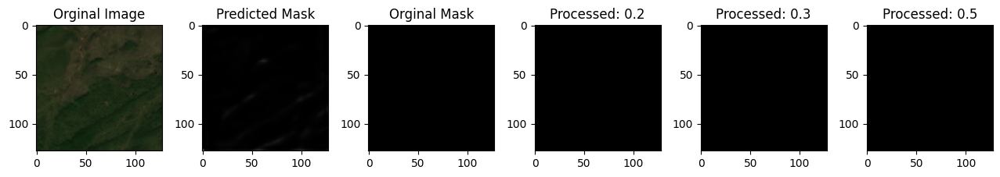

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8323 - loss: 0.1420
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8309 - loss: 0.14


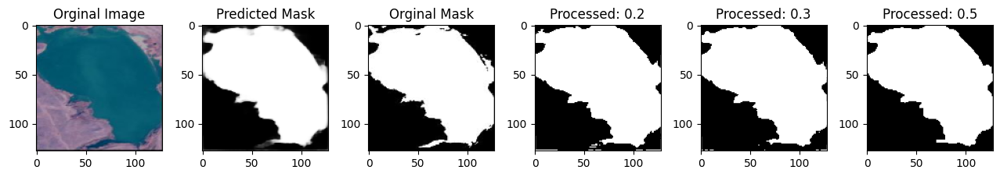

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.8309 - loss: 0.1471
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8304 - loss: 0.149


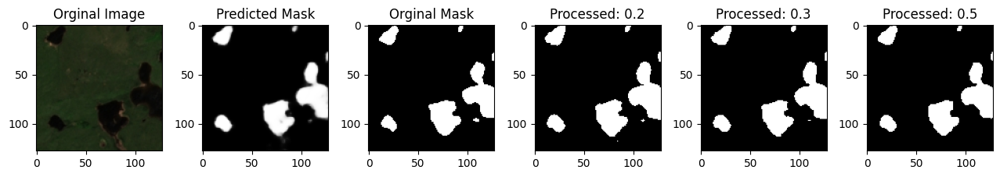

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8305 - loss: 0.1498
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8280 - loss: 0.149


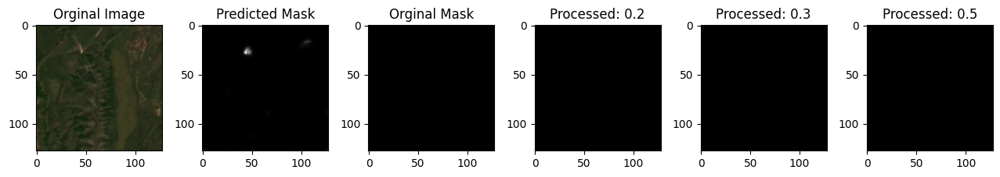

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8281 - loss: 0.1498
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8286 - loss: 0.14


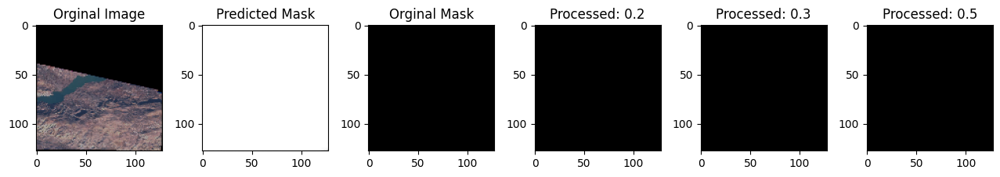

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8287 - loss: 0.1464
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8300 - loss: 0.14


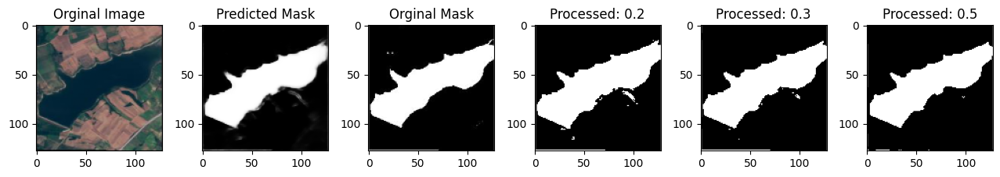

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.8300 - loss: 0.1492
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8256 - loss: 0.153


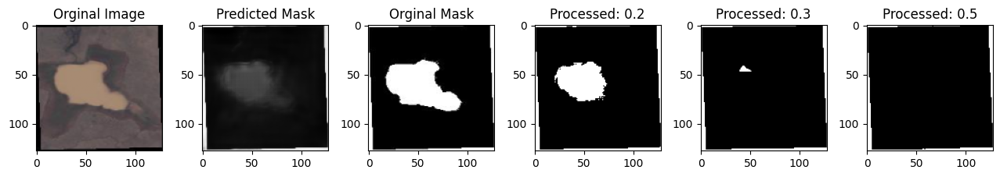

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8256 - loss: 0.1537
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8263 - loss: 0.15


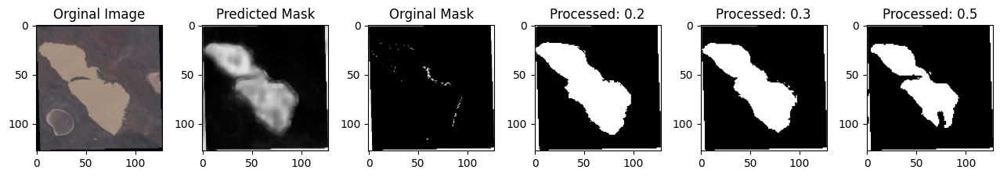

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8264 - loss: 0.1569
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8277 - loss: 0.15


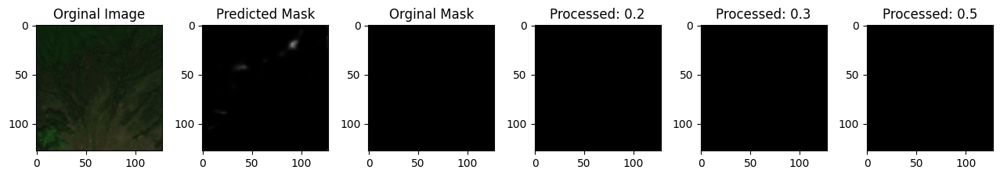

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.8277 - loss: 0.1523
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8290 - loss: 0.14


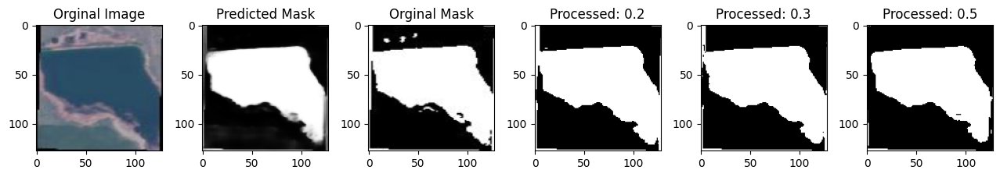

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8290 - loss: 0.1482
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7857 - loss: 0.320


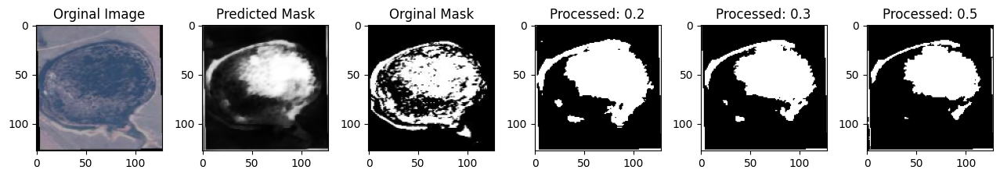

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.7858 - loss: 0.3200
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8150 - loss: 0.19


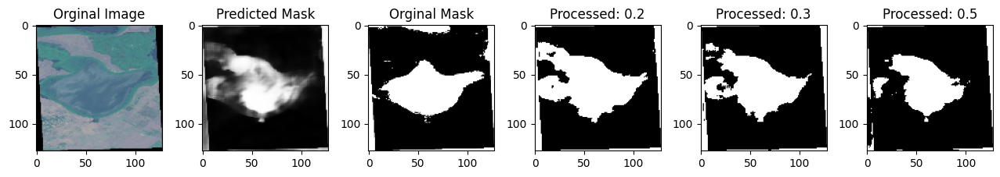

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8150 - loss: 0.1959
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8244 - loss: 0.16


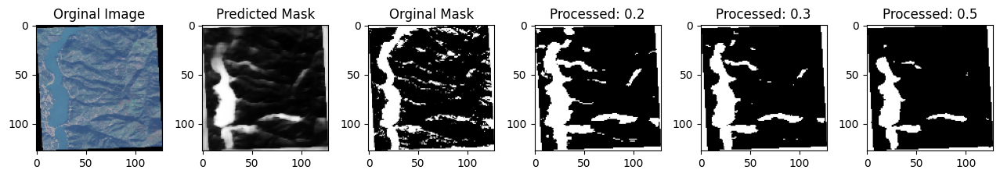

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8244 - loss: 0.1694
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8241 - loss: 0.16


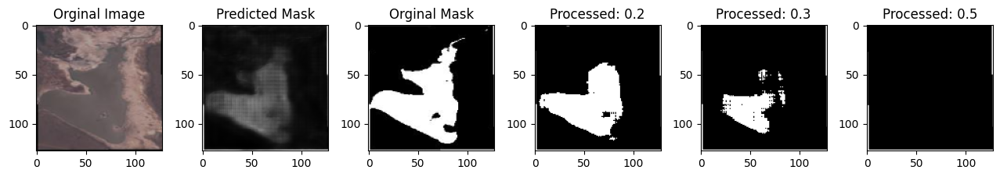

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8241 - loss: 0.1695
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.8300 - loss: 0.14


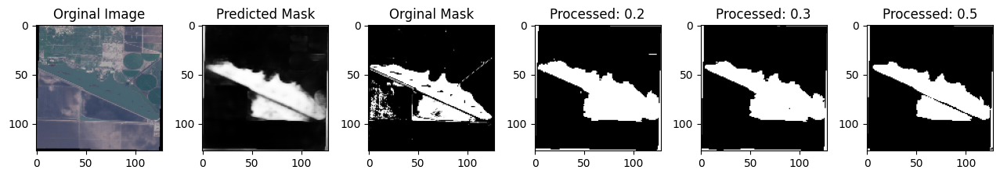

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8299 - loss: 0.1497
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8312 - loss: 0.14


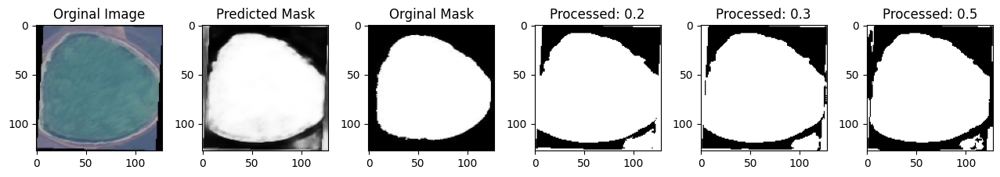

133/133 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - accuracy: 0.8312 - loss: 0.1466
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8338 - loss: 0.14


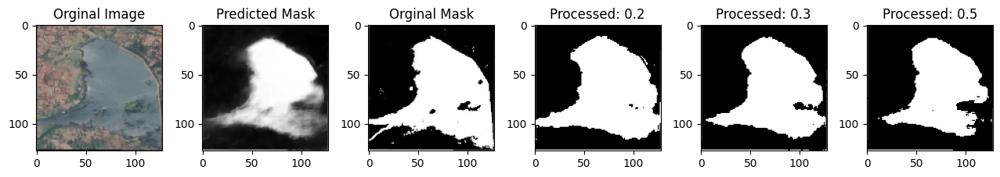

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.8338 - loss: 0.1426
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8352 - loss: 0.142


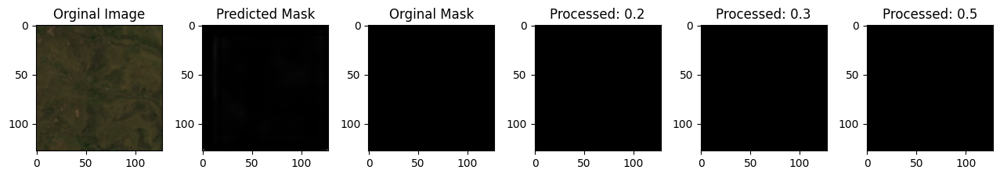

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.8351 - loss: 0.1429
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8362 - loss: 0.139


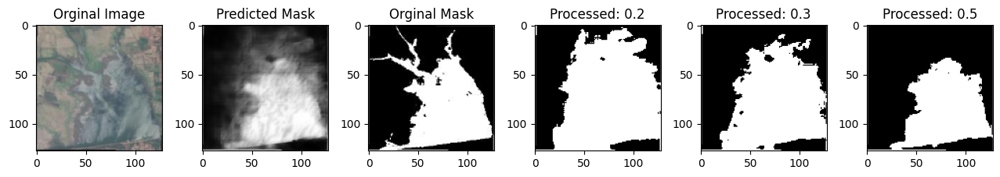

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8361 - loss: 0.1397
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8303 - loss: 0.14


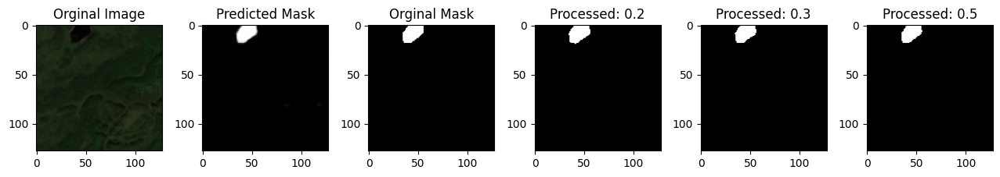

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8303 - loss: 0.1433
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/stepstep - accuracy: 0.8358 - loss: 0.136


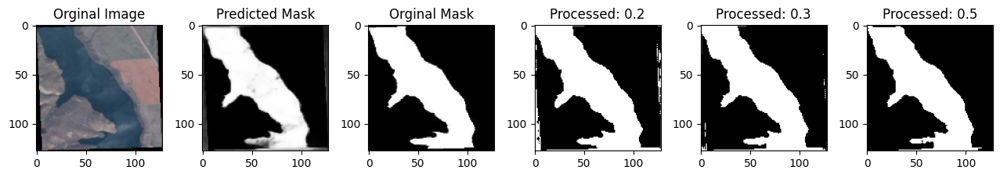

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8358 - loss: 0.1361
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8312 - loss: 0.142


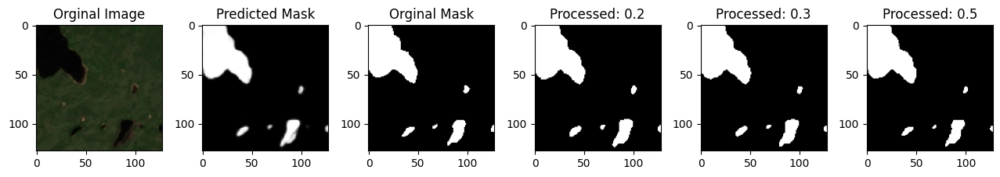

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8312 - loss: 0.1428
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8387 - loss: 0.13


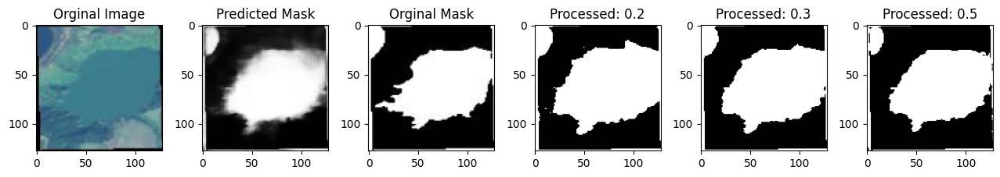

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8387 - loss: 0.1336
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8320 - loss: 0.13


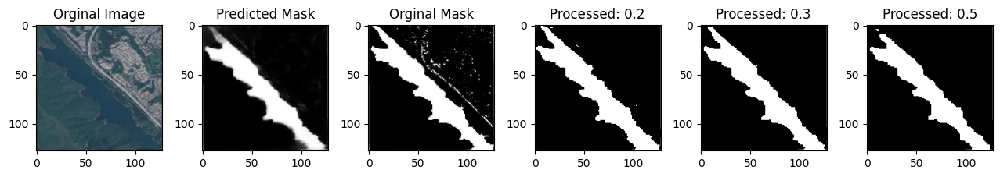

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.8320 - loss: 0.1393
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8322 - loss: 0.140


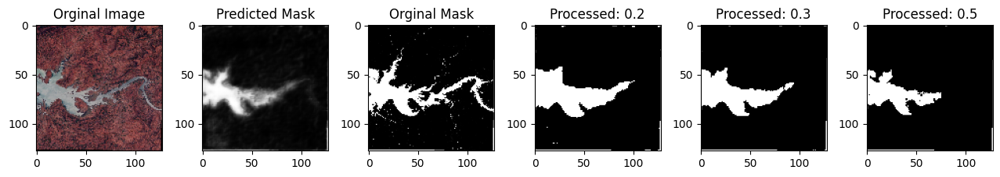

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8322 - loss: 0.1410
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8337 - loss: 0.137


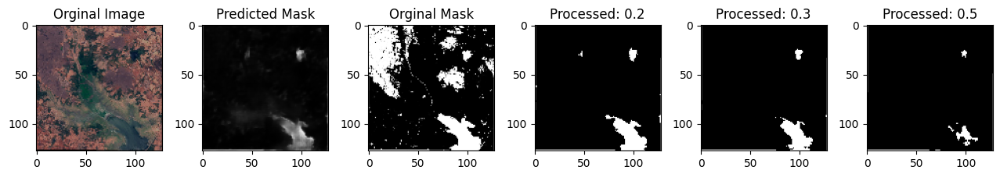

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.8337 - loss: 0.1376
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.8364 - loss: 0.135


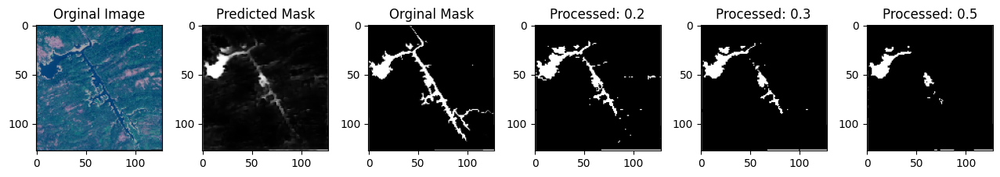

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8364 - loss: 0.1359
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8326 - loss: 0.13


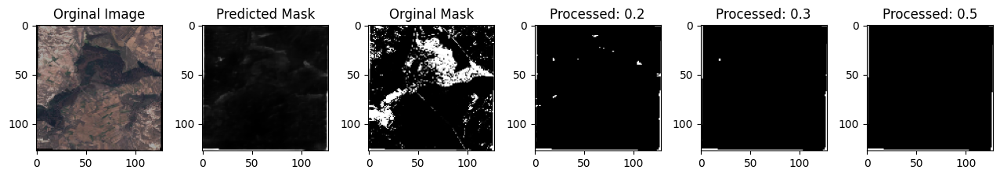

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.8326 - loss: 0.1399
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8358 - loss: 0.138


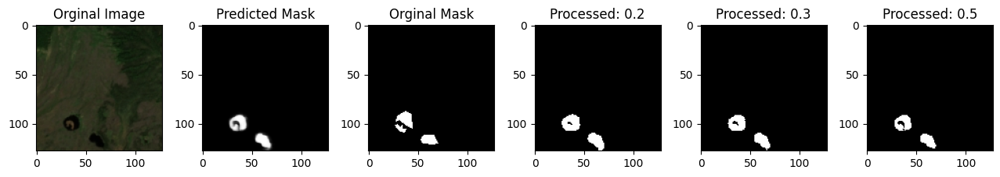

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - accuracy: 0.8357 - loss: 0.1383
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.8313 - loss: 0.14


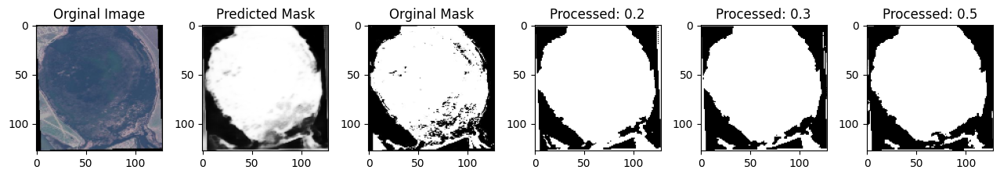

133/133 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.8313 - loss: 0.1431


In [10]:
# Training
epochs = 100
batch_size = 32

history = model.fit(images_train, mask_train,
                    epochs=epochs,
                    callbacks=[ShowProgress()],
                    batch_size=batch_size)

In [11]:
from datetime import datetime

# Get the current date and time
current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')

# Save the model with the current date and time in the filename
model.save(f'../models/{current_time}.keras')

In [12]:
# Make predictions
predictions = model.predict(images_test)

KeyError: 'pop from an empty set'